In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
image = cv2.imread('./data/image.jpg')
if image is None:
    raise FileNotFoundError(f"Изображение не найдено")

1. Найти все ORB features точки на изображении:

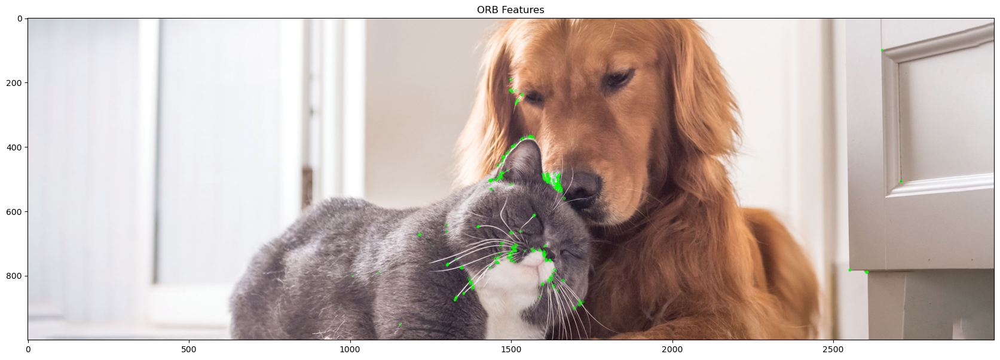

In [7]:
orb = cv2.ORB_create()
keypoints_orb, descriptors_orb = orb.detectAndCompute(image, None)
image_orb = cv2.drawKeypoints(image, keypoints_orb, None, color=(0, 255, 0), flags=0)

plt.figure(figsize=(21, 7))
plt.title('ORB Features')
plt.imshow(cv2.cvtColor(image_orb, cv2.COLOR_BGR2RGB))
plt.show()


2. Найти все SIFT features точки на изображении

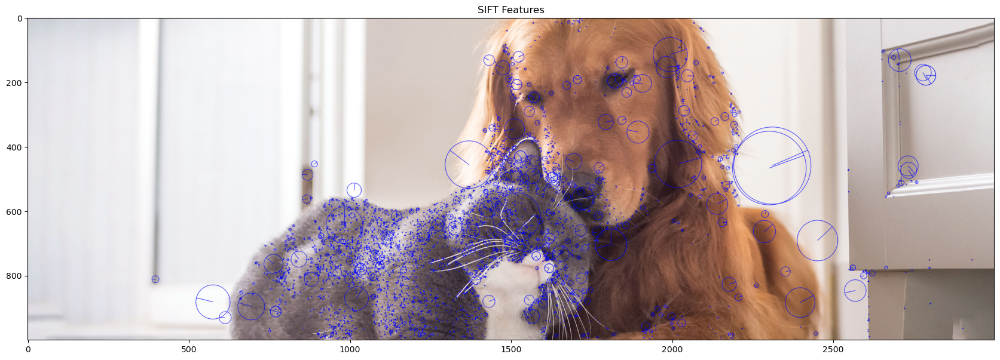

In [9]:
sift = cv2.SIFT_create()
keypoints_sift, descriptors_sift = sift.detectAndCompute(image, None)
image_sift = cv2.drawKeypoints(image, keypoints_sift, None, color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(21, 7))
plt.title('SIFT Features')
plt.imshow(cv2.cvtColor(image_sift, cv2.COLOR_BGR2RGB))
plt.show()

3. Найти Canny edges на изображении

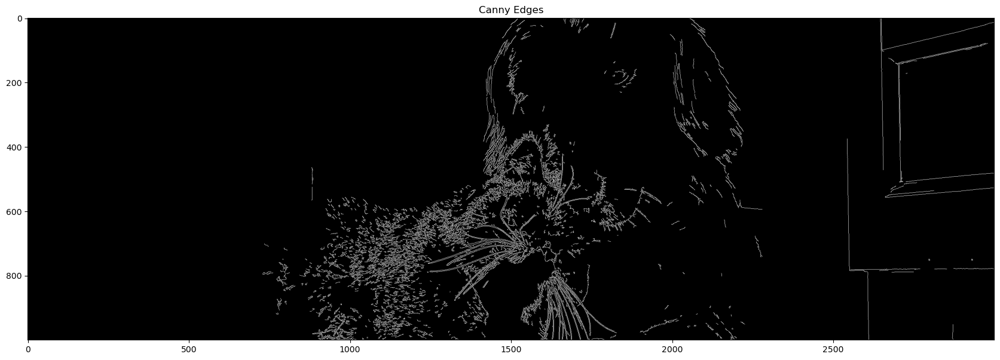

In [10]:
edges = cv2.Canny(image, 100, 200)

plt.figure(figsize=(21, 7))
plt.title('Canny Edges')
plt.imshow(edges, cmap='gray')
plt.show()

4. Перевести в grayscale

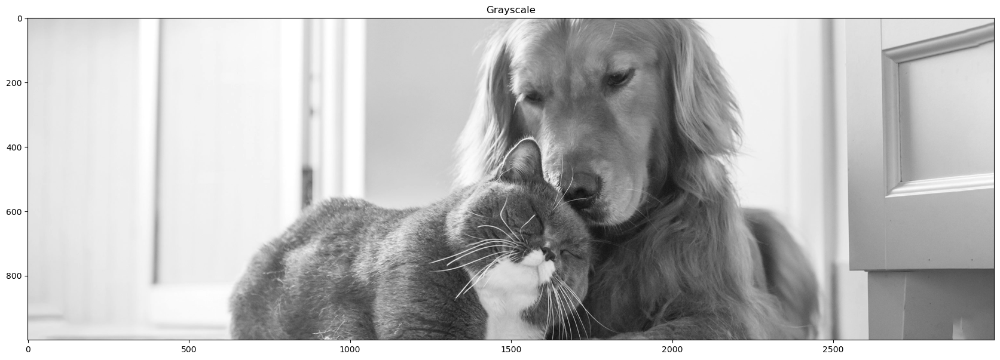

In [11]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(21, 7))
plt.title('Grayscale')
plt.imshow(gray, cmap='gray')
plt.show()

5. Перевести изображение в HSV

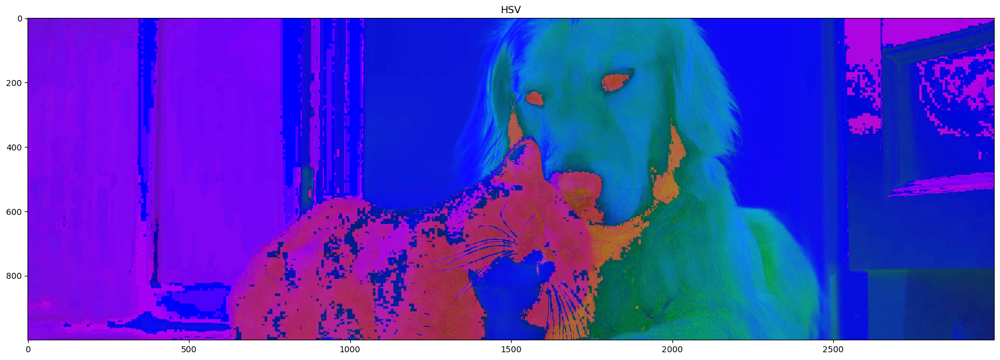

In [12]:
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

plt.figure(figsize=(21, 7))
plt.title('HSV')
plt.imshow(hsv)
plt.show()

6. Отразить изображение по правой границе

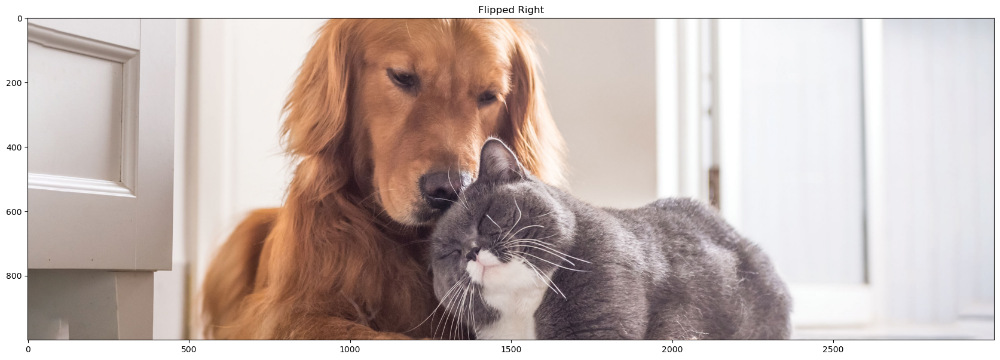

In [13]:
flipped_right = cv2.flip(image, 1)

plt.figure(figsize=(21, 7))
plt.title('Flipped Right')
plt.imshow(cv2.cvtColor(flipped_right, cv2.COLOR_BGR2RGB))
plt.show()

7. Отразить изображение по нижней границе

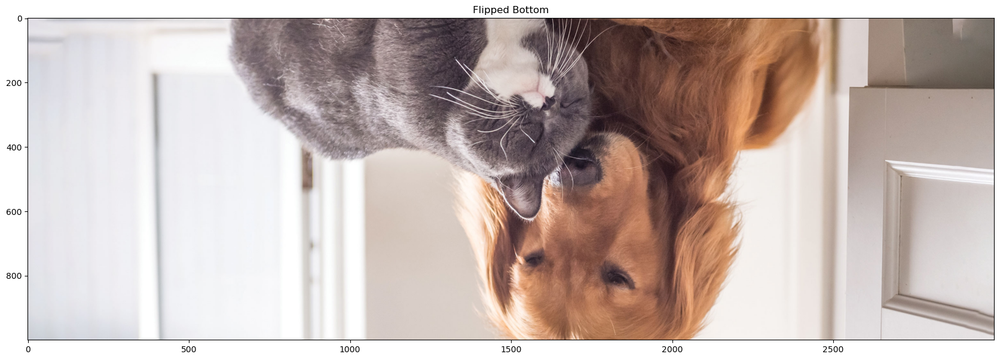

In [14]:
flipped_bottom = cv2.flip(image, 0)

plt.figure(figsize=(21, 7))
plt.title('Flipped Bottom')
plt.imshow(cv2.cvtColor(flipped_bottom, cv2.COLOR_BGR2RGB))
plt.show()

8. Повернуть изображение на 45 градусов

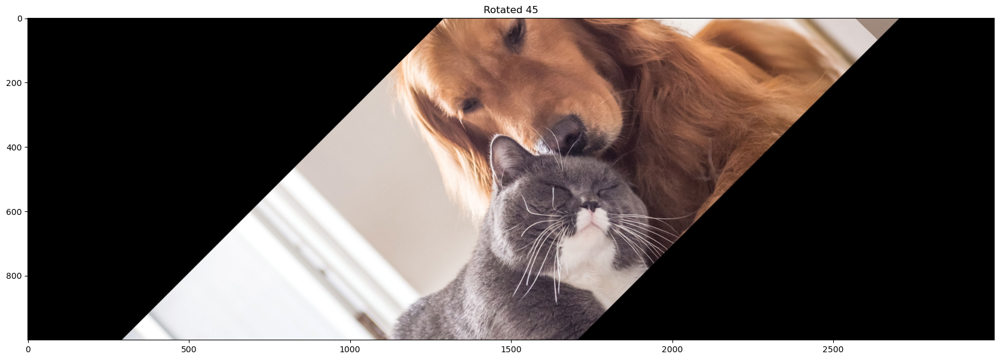

In [15]:
(h, w) = image.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, 45, 1.0)
rotated_45 = cv2.warpAffine(image, M, (w, h))

plt.figure(figsize=(21, 7))
plt.title('Rotated 45')
plt.imshow(cv2.cvtColor(rotated_45, cv2.COLOR_BGR2RGB))
plt.show()

9. Повернуть изображение на 30 градусов вокруг заданной точки

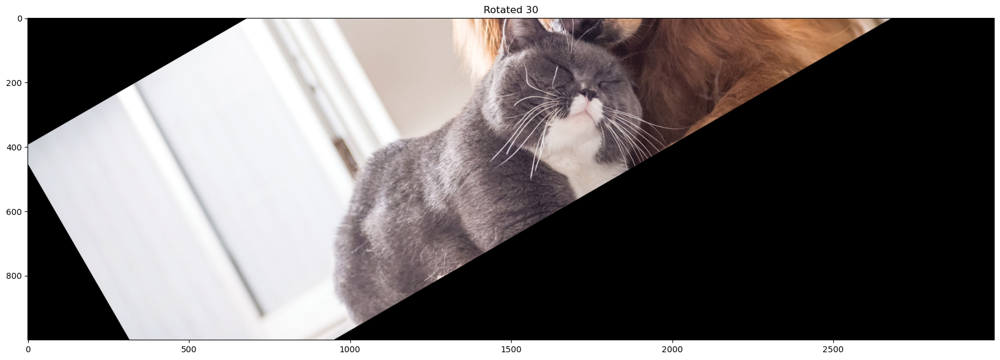

In [16]:
(h, w) = image.shape[:2]
point = (w // 4, h // 4)
M = cv2.getRotationMatrix2D(point, 30, 1.0)
rotated_30 = cv2.warpAffine(image, M, (w, h))

plt.figure(figsize=(21, 7))
plt.title('Rotated 30')
plt.imshow(cv2.cvtColor(rotated_30, cv2.COLOR_BGR2RGB))
plt.show()

10. Сместить изображение на 10 пикселей вправо

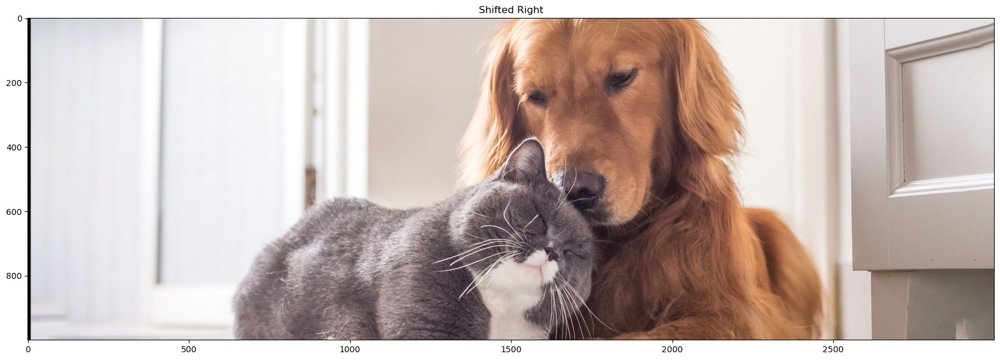

In [17]:
M = np.float32([[1, 0, 10], [0, 1, 0]])
(h, w) = image.shape[:2]
shifted_right = cv2.warpAffine(image, M, (w, h))

plt.figure(figsize=(21, 7))
plt.title('Shifted Right')
plt.imshow(cv2.cvtColor(shifted_right, cv2.COLOR_BGR2RGB))
plt.show()

11. Изменить яркость изображения

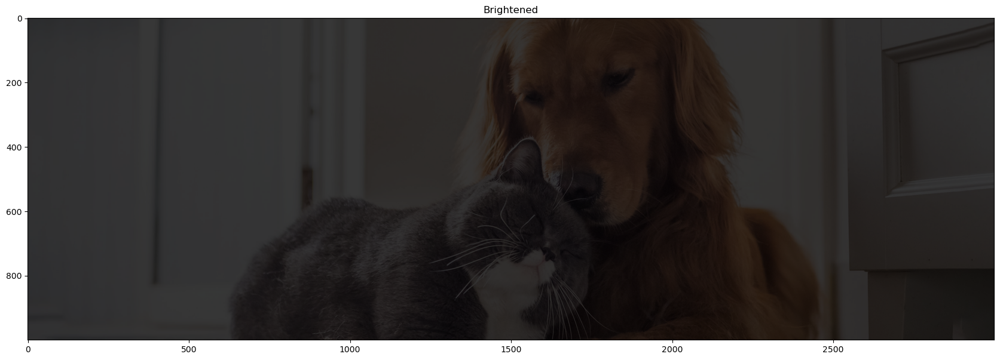

In [28]:
beta = -200
if beta != 0: 
    if beta > 0: 
        shadow = beta 
        bright = 255
    else: 
        shadow = 0
        bright = 255 + beta 

    alpha = (bright - shadow) / 255
    gamma = shadow 
    
    brightened = cv2.addWeighted(image, alpha, image, 0, gamma) 
else:
    brightened = image

plt.figure(figsize=(21, 7))
plt.title('Brightened')
plt.imshow(cv2.cvtColor(brightened, cv2.COLOR_BGR2RGB))
plt.show()